# Netherlands Neurogenetics Database
Author: Nienke Mekkes <br>
Date: 21-Sep-2022. <br>
Correspond: n.j.mekkes@umcg.nl <br>

## Script: clinical history NLP models: process_predictions
Objectives: creates clinical disease trajectories <br>


### Input files:
- prediction

### Output:
- clinical disease trajectory



### PATHS (user input required)

In [1]:
path_to_predictions2 = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/final_predictions/predictions_2022-12-15.xlsx"
general_information = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/input_data/General_information_11-08-2023.xlsx"
output_folder = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/final_predictions"
figure_folder = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/final_predictions/figures/explore"
path_to_attribute_grouping = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/input_data/sup3.xlsx" ## for rules of thumb
# diagnosis_info = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/input_data/MainDiagnosis_categories_and_metadata_NHB - 09092022.xlsx" ## for rules of thumb
diagnosis_info = "/home/jupyter-n.mekkes@gmail.com-f6d87/clinical_history/input_data/MainDiagnosis_categories_and_metadata_NBB_11-aug-2023.xlsx"


In [4]:
import seaborn as sns; sns.set()
import numpy as np; np.random.seed(0)
from matplotlib import pyplot as plt 

import xlsxwriter
import pandas as pd
import numpy as np
import re,os
import pickle
from datetime import date
from pywaffle import Waffle
from helper_functions import table_selector
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [5]:
load2 = pd.read_excel(path_to_predictions2, engine='openpyxl',index_col=0)

In [6]:
predictions_df = load2.copy()
predictions_df = predictions_df.rename(columns={"Fatique": "Fatigue"})
predictions_df['Sentence'] = predictions_df['Sentence'].astype(str)
predictions_df.drop(['Sentence_number'], axis=1,inplace=True)
non_attribute_columns = ['DonorID','Year','Sentence','age_at_death','death_year','neuropathological_diagnosis','birthyear','Age','year_before_death','sex'] #'death_year_based_on_DonorID'
attributes = [col for col in predictions_df.columns if col not in non_attribute_columns]
print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} attributes")
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

if not os.path.exists(output_folder):
    print('Creating figure folder....\n')
    os.makedirs(output_folder)
    
if not os.path.exists(figure_folder):
    print('Creating figure folder....\n')
    os.makedirs(figure_folder)


there are 213137 sentences and 90 attributes
there are 3128 unique donor IDs


In [7]:
predictions_df.head()

,DonorID,Year,Sentence,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Frontal_release_signs,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Unspecified_disturbed_gait_patt,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Head_turning_sign,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Impaired_comprehension,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Loss_of_sympathy_empathy,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Changed_behavior_personality,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home
0,NBB 1997-127,past:,Past:,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,NBB 1997-127,past:,Appendectomy,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,NBB 1997-127,1996,1996:,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,NBB 1997-127,1996,"Diagnosed with a metastasized adenocarcinoma, ...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,NBB 1997-127,1997,1997:,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Add main diagnosis and year of death (for optional filtering) 

In [11]:
general_information_df = pd.read_excel(general_information, engine='openpyxl', sheet_name="Sheet1")
## we extract main diagnosis from general info
predictions_df['neuropathological_diagnosis'] = predictions_df['DonorID'].map(general_information_df.set_index('DonorID')['paper diagnosis'])
predictions_df['neuropathological_diagnosis'] = predictions_df['neuropathological_diagnosis'].str.strip('[]').str.strip('"').str.strip("'").str.replace(' ', '')

pd.set_option("display.max_rows", 150)
donors_to_remove = list(general_information_df[general_information_df['paper diagnosis']=='exclude'].DonorID)
predictions_df = predictions_df[~predictions_df['DonorID'].isin(donors_to_remove)]
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")
print(f"{len(donors_to_remove)} donors were removed")
print(predictions_df['neuropathological_diagnosis'].value_counts())
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

there are 3043 unique donor IDs
258 donors were removed
AD                       43279
CON                      17064
MS,MS-SP                 14393
PDD                      11211
PD                       10557
AD,DLB                    9002
MS,MS-PP                  8082
PSP                       7575
MSA                       5563
VD                        5139
DLB,SICC                  5073
PSYCH,BP                  5021
FTD,FTD-TDP_undefined     4863
PSYCH,MDD                 4224
DEM,SICC                  3170
FTD,FTD-TAU,TAU           3006
AD,CA                     2652
MS_undefined              2583
FTD,PID                   2413
AD,ILBD                   2268
DLB                       2177
FTD,FTD-TDP-B,C9ORF72     2124
HIP                       2091
MS,MS-RR                  1740
PD,AD                     1584
AD,ENCEPHA,VE             1565
IS                        1506
PSYCH,SCZ                 1464
FTD,FTD-TDP-A,PROG        1460
HD                        1397
CBD           

In [12]:


print(len(set(list(general_information_df['DonorID'].unique())) - set(list(predictions_df['DonorID'].unique()))))
print(f"some donors are present in general information, but not in our predictions file, "\
      f"these are: {set(list(general_information_df['DonorID'].unique())) - set(list(predictions_df['DonorID'].unique()))}")

## we take the year of death as the year mentioned in the date/time column. however, if this column is nan, we take the year of the donorID as a substitute
predictions_df['age_at_death'] = predictions_df['DonorID'].map(general_information_df.set_index('DonorID')['Age']).astype(int)
predictions_df['death_year_based_on_DonorID'] = predictions_df['DonorID'].str.strip('NBB ').str.split('-').str[0].astype(int)
predictions_df['death_year'] = predictions_df['DonorID'].map(general_information_df.set_index('DonorID')['Date_and_time_of_death'])
predictions_df['death_year'] = predictions_df['death_year'].str.slice(start=6, stop=10, step=1)
predictions_df['death_year'] = predictions_df['death_year'].replace(np.nan, '9').astype(int)
predictions_df.loc[predictions_df['death_year'] == 9, 'death_year'] = predictions_df['death_year_based_on_DonorID']
predictions_df = predictions_df.drop(columns=['death_year_based_on_DonorID'])


## get birthyear and sex as well (sex is based on genetics, when genetics is inconclusive we take reported sex in file)
predictions_df['birthyear'] = predictions_df['death_year']-predictions_df['age_at_death']
predictions_df['sex'] = predictions_df['DonorID'].map(general_information_df.set_index('DonorID')['most_likely_sex'])

# display(predictions_df)
print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} columns")
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

258
some donors are present in general information, but not in our predictions file, these are: {'NBB 2021-008', 'NBB 2021-019', 'NBB 2019-083', 'NBB 1998-050', 'NBB 1991-124', 'NBB 2020-074', 'NBB 2020-086', 'NBB 2001-007', 'NBB 2021-040', 'NBB 2021-025', 'NBB 2020-009', 'NBB 1997-018', 'NBB 2021-007', 'NBB 2002-090', 'NBB 2020-042', 'NBB 2020-061', 'NBB 1999-017', 'NBB 2021-006', 'NBB 2001-027', 'NBB 2021-028', 'NBB 2020-079', 'NBB 2021-021', 'NBB 2014-042', 'NBB 2020-106', 'NBB 2020-085', 'NBB 1994-057', 'NBB 2020-121', 'NBB 2020-020', 'NBB 1993-158', 'NBB 2020-102', 'NBB 2021-050', 'NBB 2019-080', 'NBB 2009-004', 'NBB 2021-034', 'NBB 2021-009', 'NBB 2013-057', 'NBB 2018-055', 'NBB 1993-024', 'NBB 2017-030', 'NBB 2020-031', 'NBB 2019-115', 'NBB 2019-107', 'NBB 2019-058', 'NBB 2013-018', 'NBB 2016-089', 'NBB 2019-069', 'NBB 2020-053', 'NBB 2016-099', 'NBB 1998-202', 'NBB 2010-065', 'NBB 1995-011', 'NBB 2020-066', 'NBB 2020-084', 'NBB 2021-022', 'NBB 2017-087', 'NBB 2020-093', 'NBB 20


## Cleaning and filtering of predictions
There are many filtering and cleaning steps in the predicted data
- Remove donors < 21
- Remove attributes that performed poorly
- Merge the synonym attributes
- clean up sentences:
  - remove ultrashort sentences
  - remove date indications
- fix dates
  - past becomes unknown
  - last 2 years/last 2 months etc. can be converted to years
- Optional: remove certain diagnoses ('unknown', etc.)

#### drop < 21

In [6]:
# predictions_df = predictions_df.loc[predictions_df['age_at_death'] >= 21]
# print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} columns")
# print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

#### remove BAD PERFORMING ATTRIBUTES

In [13]:
BERTbad = ['Unspecified_disturbed_gait_patt',
           'Loss_of_sympathy_empathy',
           'Head_turning_sign',
           'Impaired_comprehension',
           'Changed_behavior_personality',
           'Frontal_release_signs']


predictions_df = predictions_df.drop(columns=BERTbad)
attributes = [col for col in predictions_df.columns if col not in non_attribute_columns]
print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} columns")
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")



there are 207033 sentences and 84 columns
there are 3043 unique donor IDs


#### clean sentences

In [14]:
sentences_to_remove = ['Past:','Last two years:','Last 2 years:','Last two months:','Last 2 months:','In the past:','0','M.',
                       'January:','February:','March:','April:','May:','June:','July:','August:','September:','October:','November:','December:',
                       'January','February','March','April','May','June','July','August','September','October','November','December'
                      ]
year = "^[12][0-9]{3}:$"
year2 = "^[12][0-9]{3}$"
year3 = "^\([12][0-9]{3}\)$"
m = predictions_df['Sentence'].str.contains(year)
m2 = predictions_df['Sentence'].str.contains(year2)
m3 = predictions_df['Sentence'].str.contains(year3)
predictions_df = predictions_df[~m]
predictions_df = predictions_df[~m2]
predictions_df = predictions_df[~m3]
predictions_df = predictions_df[~predictions_df['Sentence'].isin(sentences_to_remove)]

## some sentences are just one word notitions. we detected a few relevant ones that we want to keep
short_symptoms = ['tia','uti','copd','gout','coma','pick','cva']
predictions_df = predictions_df.loc[(predictions_df['Sentence'].str.len() > 2) | \
                      predictions_df['Sentence'].str.contains('|'.join(short_symptoms),case=False)]
print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} columns")
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

/tmp/ipykernel_3480/2115369798.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  predictions_df = predictions_df[~m2]
/tmp/ipykernel_3480/2115369798.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  predictions_df = predictions_df[~m3]


there are 193862 sentences and 84 columns
there are 3043 unique donor IDs



#### fix years

In [15]:
# select dataframe part without integer year value
not_years = predictions_df[predictions_df['Year'].apply(lambda x: not x.isnumeric())]
print(f"these are the non integer years: {not_years['Year'].unique()}")

## we define some rules to convert unknown but described years to actual years
not_years.loc[not_years.Year == 'last two months:', 'Year'] = not_years['death_year']
not_years.loc[not_years.Year == 'last 2 months:', 'Year'] = not_years['death_year']
not_years.loc[not_years.Year == 'at birth:', 'Year'] = not_years['death_year'] - not_years['age_at_death']
not_years.loc[not_years.Year == 'year unknown', 'Year'] = -9
not_years.loc[not_years.Year == 'past:', 'Year'] = -9

last_two_years1 = not_years.loc[(not_years['Year'] == 'last two years:') | (not_years['Year'] == 'last 2 years:')]
last_two_years1['Year'] = last_two_years1['death_year']
last_two_years2 = not_years.loc[(not_years['Year'] == 'last two years:') | (not_years['Year'] == 'last 2 years:')]
last_two_years2['Year'] = last_two_years2['death_year']-1
last_two_years3 = not_years.loc[(not_years['Year'] == 'last two years:') | (not_years['Year'] == 'last 2 years:')]
last_two_years3['Year'] = last_two_years3['death_year']-2
last_two_years = pd.concat([last_two_years1,last_two_years2,last_two_years3], ignore_index=True)
not_years = pd.concat([not_years, last_two_years], ignore_index=True)
# display(not_years)

# add in the fixed years
predictions_df = pd.concat([predictions_df, not_years], ignore_index=True)
predictions_df = predictions_df[pd.to_numeric(predictions_df['Year'], errors='coerce').notnull()]
predictions_df['Year'] =predictions_df['Year'].astype(int)
# print(predictions_df['Year'].unique())
print(f"there are {predictions_df.shape[0]} sentences and {len(attributes)} columns")
print(f"there are {len(list(predictions_df['DonorID'].unique()))} unique donor IDs")

these are the non integer years: ['past:' 'year unknown' 'last two years:' 'last 2 years:'
 'last two months:' 'last 2 months:' 'at birth:']


/tmp/ipykernel_3480/1577720148.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  last_two_years1['Year'] = last_two_years1['death_year']
/tmp/ipykernel_3480/1577720148.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  last_two_years2['Year'] = last_two_years2['death_year']-1
/tmp/ipykernel_3480/1577720148.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

there are 194342 sentences and 84 columns
there are 3043 unique donor IDs


#### Create age and year before death
age is the age of a donor when a sentence happened <br>
year before death is the same as age, but calculated back from the year of death <br>

year before death cannot be > 0, these sentences are changed to year unknown (-9) and year before death unknown (9) <br> 
age cannot be < 0, these sentences are changed to year unknown (-9), and age is also put at -9<br>
if age equals -1, this is acceptable, and age is changed to 0<br>

In [69]:
## every event has a year when it happens. this can be converted to how many years before deat/or at what age/ the event happened
predictions_df['year_before_death'] = predictions_df['Year'] - predictions_df['death_year']
predictions_df.loc[predictions_df.year_before_death > 0, 'year_before_death'] = 9
predictions_df.loc[predictions_df.year_before_death > 0, 'Year'] = -9
predictions_df.loc[predictions_df.year_before_death < -110, 'year_before_death'] = 9
predictions_df.loc[predictions_df.year_before_death < -110, 'Year'] = -9

predictions_df['Age'] = predictions_df['Year'] - predictions_df['birthyear']
predictions_df.loc[predictions_df.Age == -1, 'Age'] = 0
predictions_df.loc[predictions_df.Age < 0, 'Age'] = -9
predictions_df.loc[predictions_df.Age == -9 , 'Year'] = -9
# display(predictions_df.loc[(predictions_df['year_before_death'] > 0)]) #& (predictions_df['Year'] < -9)])
display(predictions_df.sort_values('age_at_death'))

## before continuing to clinical disease trajectory, copy data for full corpus sentence data exploration later
# predictions_df.to_excel(f"{output_folder}/predictions_per_sentence_{date.today()}.xlsx")
data_exploration_df = predictions_df.copy()

,DonorID,Year,Sentence,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home,neuropathological_diagnosis,age_at_death,death_year,birthyear,sex,year_before_death,Age
145124,NBB 1998-116,1998,On the same day he died.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,8,1998,1990,M,0,8
145110,NBB 1998-116,1998,In April he was admitted once more with 40C fe...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,8,1998,1990,M,0,8
145111,NBB 1998-116,1998,He had lost a lot of weight.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,CON,8,1998,1990,M,0,8
145112,NBB 1998-116,1998,Chest X-ray showed no real abnormalities.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,8,1998,1990,M,0,8
145113,NBB 1998-116,1998,Cultures revealed nothing.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,8,1998,1990,M,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163320,NBB 2018-064,2011,"In February she experienced headache, and pain...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,CON,103,2018,1915,F,-7,96
163319,NBB 2018-064,2011,"She was active, for example with gardening.",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,103,2018,1915,F,-7,96
163318,NBB 2018-064,2011,"Mild forgetfulness was reported, only once. (2...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,103,2018,1915,F,-7,96
163325,NBB 2018-064,2010,In June she reported pain and stiffness in he

### create pretty sentences for reviewer

In [23]:
comma_df = predictions_df#.drop(['sum_true','sentence_length'], axis=1)
attribute_grouping = pd.read_excel(path_to_attribute_grouping, engine='openpyxl', index_col=[0])
correct_names = {}
for attr, real_name in zip(attribute_grouping["AttributeUpdated"], attribute_grouping["ITname"]):
    if not isinstance(real_name, float):
        correct_names[real_name] = attr
print(correct_names)
comma_df = comma_df.rename(correct_names,axis=1)
comma_df = comma_df.sort_values(by=['DonorID','Year'])

comma_df.loc[:, 'Muscle weakness':'Admission to nursing home'] = comma_df.loc[:, 'Muscle weakness':'Admission to nursing home'].replace(0, np.nan)  
comma_df.loc[:, 'Muscle weakness':'Admission to nursing home'] = comma_df.loc[:, 'Muscle weakness':'Admission to nursing home'].replace(1, pd.Series(comma_df.columns, comma_df.columns))
comma_df['Attribute(s)'] = comma_df.loc[:, 'Muscle weakness':'Admission to nursing home'].apply(lambda x: ','.join(x[x.notnull()]), axis = 1)
comma_df = comma_df[['DonorID','Year','neuropathological_diagnosis','Sentence','Attribute(s)']]
display(comma_df.head(5))
comma_df.to_excel(f"{output_folder}/reviewer_sentences_{date.today()}.xlsx")

{'Amnesia': 'Amnesia', 'Bradyphrenia': 'Bradyphrenia', 'Cognitive_decline': 'Cognitive decline', 'Confabulations': 'Confabulation', 'Dementia': 'Dementia', 'Forgetfulness': 'Forgetful', 'Head_turning_sign': 'Headturning sign', 'Impaired_recognition': 'Agnosia', 'Imprinting_disturbances': 'Poor short-term memory', 'Memory_impairment': 'Memory impairment', 'Aphasia': 'Aphasia', 'Apraxia': 'Apraxias', 'Executive_function_disorder': 'Executive dysfunction', 'Facade_behavior': 'Façade behavior', 'Impaired_comprehension': 'Limited language comprehension', 'Lack_of_insight': 'Anosognosia', 'Lack_of_planning_organis_overv': 'Lack of planning / organization / overview', 'Language_impairment': 'Verbal impairment', 'Word_finding_problems': 'Anomia', 'Apathy_inertia': 'Apathy', 'Disinhibition': 'Social disinihibition', 'Frontal_release_signs': 'Frontal release signs', 'Hyperorality': 'Hyperorality', 'Lack_of_initiative': 'Lack of initiative', 'Loss_of_decorum': 'Socially inappropriate behavior', '

,DonorID,Year,neuropathological_diagnosis,Sentence,Attribute(s)
194731,NBB 1982-016,-9,TUM,Medullar mammacarcinoma with multiple metastasis.,
56188,NBB 1982-016,1975,TUM,Mastectomy left side followed by radiotherapy.,
56189,NBB 1982-016,1978,TUM,"Mastectomy right side, with metastases in the ...",
56190,NBB 1982-016,1980,TUM,Radiotherapy because of metastases in the righ...,
56191,NBB 1982-016,1981,TUM,Brainmetastases treated by radiotherapy,



#### from sentences to yearly boolean

In [24]:
predictions_df['DonorID'].value_counts()
display(predictions_df.columns)

grouping_columns = ['DonorID','Age','neuropathological_diagnosis','year_before_death',
                       'death_year','age_at_death','birthyear','Year','sex'] # Sentence left out 
grouping_columns2 = ['DonorID','Age','neuropathological_diagnosis',
                       'death_year','age_at_death','birthyear','Year','sex'] # Sentence left out 
##from sentences to year, e.g. 2 sentences in a year are converted to a single year event
predictions_df_group = predictions_df.groupby(grouping_columns, as_index=False).sum()

## belangrijk, we hebben nu meerdere rijen met -9. deze moeten worden gesumd. 
## ze werden nu eerst naar 1 gezet, en daarna gesumd.
## ik  heb dit nu gedaan door 'year_before_death' weg te halen uit de grouping columns!
## important: value larger than 1 (meaning multiple events/sentences in one year) are reset to 1
predictions_df_group.loc[:,[i for i in list(predictions_df_group.columns) if i not in non_attribute_columns]] = predictions_df_group.loc[:,[i for i in list(predictions_df_group.columns) if i not in non_attribute_columns]].apply(lambda x: [y if y <= 1 else 1 for y in x])
predictions_df_group = predictions_df_group.sort_values(by=['DonorID','Age'])
display(predictions_df_group[predictions_df_group['DonorID'] == 'NBB 1998-133'])
predictions_df_group = predictions_df_group.groupby(grouping_columns2, as_index=False).sum()
display(predictions_df_group[predictions_df_group['DonorID'] == 'NBB 1998-133'])

Index(['DonorID', 'Year', 'Sentence', 'Muscular_Weakness', 'Spasticity',
       'Hyperreflexia_and_oth_reflexes', 'Fasciculations',
       'Positive_sensory_symptoms', 'Negative_sensory_symptoms',
       'Parkinsonism', 'Facial_masking', 'Tremor', 'Bradykinesia', 'Rigidity',
       'Vertigo', 'Nystagmus', 'Ataxia', 'Loss_of_coordination',
       'Balance_problems', 'Frequent_falls', 'Decreased_motor_skills',
       'Mobility_problems', 'Dementia', 'Cognitive_decline', 'Bradyphrenia',
       'Lack_of_insight', 'Facade_behavior', 'Memory_impairment', 'Amnesia',
       'Forgetfulness', 'Imprinting_disturbances', 'Impaired_recognition',
       'Confabulations', 'Disorientation', 'Wandering', 'Confusion', 'Aphasia',
       'Word_finding_problems', 'Language_impairment',
       'Communication_problems', 'Dysarthria', 'Apraxia',
       'Executive_function_disorder', 'Lack_of_planning_organis_overv',
       'Concentration_problems', 'Disinhibition', 'Loss_of_decorum',
       'Apathy_inertia', 

/tmp/ipykernel_3480/2037334499.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  predictions_df_group = predictions_df.groupby(grouping_columns, as_index=False).sum()


,DonorID,Age,neuropathological_diagnosis,year_before_death,death_year,age_at_death,birthyear,Year,sex,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home


,DonorID,Age,neuropathological_diagnosis,death_year,age_at_death,birthyear,Year,sex,year_before_death,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home




#### Remove synonyms by merging column values, save as dataframe (easy to read)

In [16]:
# def synonym_merger(df, how=None):
#     if how == 'sum':
#         df["Loss_of_coordination"] = df[["Ataxia", "Loss_of_coordination"]].sum(axis=1)
#         df["Apathy_inertia"] = df[["Apathy_inertia", "Lack_of_initiative"]].sum(axis=1)
#         df["Dementia"] = df[["Dementia", "Cognitive_decline"]].sum(axis=1)
#         df["Executive_function_disorder"] = df[["Executive_function_disorder", "Lack_of_planning_organis_overv"]].sum(axis=1)
#     elif how == 'max':
#         df["Loss_of_coordination"] = df[["Ataxia", "Loss_of_coordination"]].max(axis=1)
#         df["Apathy_inertia"] = df[["Apathy_inertia", "Lack_of_initiative"]].max(axis=1)
#         df["Dementia"] = df[["Dementia", "Cognitive_decline"]].max(axis=1)
#         df["Executive_function_disorder"] = df[["Executive_function_disorder", "Lack_of_planning_organis_overv"]].max(axis=1)
#     df.drop(['Lack_of_initiative','Cognitive_decline','Ataxia',"Lack_of_planning_organis_overv"], axis=1,inplace=True)
#     return df


# predictions_df_group = synonym_merger(predictions_df_group,how='max')
# display(predictions_df_group)
# predictions_df_group.to_excel(f"{output_folder}/ALL_clinical_trajectories_df_{date.today()}.xlsx")
# predictions_df_group.to_pickle(f"{output_folder}/ALL_clinical_trajectories_df_{date.today()}.pkl") 

# attributes = [col for col in predictions_df_group.columns if col not in non_attribute_columns]
# print(f"there are {predictions_df_group.shape[0]} sentences and {len(attributes)} columns")
# print(f"there are {len(list(predictions_df_group['DonorID'].unique()))} unique donor IDs")



In [25]:
# def synonym_merger_new(df, how=None):
#     if how == 'sum':
#         df["Loss_of_coordination"] = df[["Ataxia", "Loss_of_coordination"]].sum(axis=1)
#         # df["Apathy_inertia"] = df[["Apathy_inertia", "Lack_of_initiative"]].sum(axis=1)
#         # df["Dementia"] = df[["Dementia", "Cognitive_decline"]].sum(axis=1)
#         # df["Executive_function_disorder"] = df[["Executive_function_disorder", "Lack_of_planning_organis_overv"]].sum(axis=1)
#         # df["Memory_impairment"] = df[["Memory_impairment", "Amnesia","Forgetfulness","Imprinting_disturbances"]].sum(axis=1)
#         # df["Disorientation"] = df[["Disorientation", "Wandering"]].sum(axis=1)
#     elif how == 'max':
#         df["Loss_of_coordination"] = df[["Ataxia", "Loss_of_coordination"]].max(axis=1)
#         # df["Apathy_inertia"] = df[["Apathy_inertia", "Lack_of_initiative"]].max(axis=1)
#         # df["Dementia"] = df[["Dementia", "Cognitive_decline"]].max(axis=1)
#         # df["Executive_function_disorder"] = df[["Executive_function_disorder", "Lack_of_planning_organis_overv"]].max(axis=1)
#         # df["Memory_impairment"] = df[["Memory_impairment", "Amnesia","Forgetfulness","Imprinting_disturbances"]].max(axis=1)
#         # df["Disorientation"] = df[["Disorientation", "Wandering"]].max(axis=1)
#     df.drop(['Ataxia',], axis=1,inplace=True)
#     return df


# predictions_df_group = synonym_merger_new(predictions_df_group,how='max')
# display(predictions_df_group)
predictions_df_group.to_excel(f"{output_folder}/ALL_clinical_trajectories_df_{date.today()}.xlsx")
predictions_df_group.to_pickle(f"{output_folder}/ALL_clinical_trajectories_df_{date.today()}.pkl") 

attributes = [col for col in predictions_df_group.columns if col not in non_attribute_columns]
print(f"there are {predictions_df_group.shape[0]} sentences and {len(attributes)} columns")
print(f"there are {len(list(predictions_df_group['DonorID'].unique()))} unique donor IDs")


there are 29679 sentences and 84 columns
there are 3043 unique donor IDs


#### Save as dict of dicts (easy to use)

In [26]:
drop_columns = ['year_before_death','death_year','birthyear'] # keep donorid, age, year,'age_at_death',,'sex'


dict_prep = predictions_df_group.copy()
dict_prep.drop(drop_columns, axis=1,inplace=True)
dict_prep = dict_prep.set_index('Age')


dict_of_dicts = {} 
for i in dict_prep.DonorID.unique():
    subdictcontent = dict_prep.loc[(dict_prep['DonorID'] == i)]
#     display(subdictcontent)
    subdictcontent.drop(['DonorID'],axis=1,inplace=True)
    subdictcontent = subdictcontent.T
    subdict = subdictcontent.to_dict()
    dict_of_dicts[i] = subdict

pickle_out = open(f"{output_folder}/ALL_clinical_trajectories_dictionary_{date.today()}.pkl","wb")
pickle.dump(dict_of_dicts,pickle_out)
pickle_out.close()

/tmp/ipykernel_3480/325371710.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subdictcontent.drop(['DonorID'],axis=1,inplace=True)
/tmp/ipykernel_3480/325371710.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subdictcontent.drop(['DonorID'],axis=1,inplace=True)
/tmp/ipykernel_3480/325371710.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subdictcontent.drop(['DonorID'],axis=1,inplace=True)
/tmp/ipykernel_3480/325371710.p

In [27]:
## rules of thumb

#         Applies 'rules of thumb' to the data which are:
#         1. A donor has been diagnosed with a neurodegenerative disease as defined in ‘main diagnosis_categories_and_metadata_nhb’ 
#         2. The clinical attribute is a neurodegeneration associated trait as defined in ‘Clinical History - attributes grouping in categories - metadata’
#         3. In the years without information no labels will be given

In [28]:
## Load attribute and diagnosis information
# neurodeg_att = pd.read_excel(path_to_attribute_grouping, engine='openpyxl', index_col=[0], sheet_name='90 parameters')
neurodeg_att = attribute_grouping.copy()
neurodeg_att['IsNeurodegenerationAssociatedTrait'] = neurodeg_att['IsNeurodegenerationAssociatedTrait'].astype(bool)
# display(neurodeg_att)
# neurodeg_att_list = neurodeg_att[neurodeg_att['IsNeurodegenerationAssociatedTrait']==True].AttributeUpdated.values
neurodeg_att_list = neurodeg_att[neurodeg_att['IsNeurodegenerationAssociatedTrait']==True].ITname.values
print(neurodeg_att_list)

neurodeg_dis = pd.read_excel(diagnosis_info, engine='openpyxl', index_col=[0], sheet_name='Bioportal links & metadata - up')
neurodeg_dis_list = neurodeg_dis[neurodeg_dis['CategoryType'] == 'ProgressiveNeurodegenerativeDisease'].index.values
print(neurodeg_dis[neurodeg_dis['CategoryType'] != 'ProgressiveNeurodegenerativeDisease'].index.values)
print(neurodeg_dis_list)

['Amnesia' 'Bradyphrenia' 'Cognitive_decline' 'Confabulations' 'Dementia'
 'Forgetfulness' 'Head_turning_sign' 'Impaired_recognition'
 'Imprinting_disturbances' 'Memory_impairment' 'Aphasia' 'Apraxia'
 'Executive_function_disorder' 'Impaired_comprehension' 'Lack_of_insight'
 'Lack_of_planning_organis_overv' 'Language_impairment'
 'Word_finding_problems' 'Apathy_inertia' 'Disinhibition'
 'Frontal_release_signs' 'Hyperorality' 'Lack_of_initiative'
 'Loss_of_decorum' 'Loss_of_sympathy_empathy' 'Communication_problems'
 'Concentration_problems' 'Admission_to_nursing_home' 'Day_care'
 'Help_in_ADL' 'Ataxia' 'Balance_problems' 'Loss_of_coordination'
 'Nystagmus' 'Vertigo' 'Bradykinesia' 'Facial_masking' 'Parkinsonism'
 'Rigidity' 'Tremor' 'Dysarthria' 'Fasciculations'
 'Hyperreflexia_and_oth_reflexes' 'Muscular_Weakness'
 'Swallowing_problems_Dysphagia' 'Decreased_motor_skills' 'Frequent_falls'
 'Mobility_problems' 'Unspecified_disturbed_gait_patt' 'Disorientation'
 'Wandering' 'Changed_beha

In [29]:
## create additional column to check if one or more of the donor's diagnosis is neurodegenerative 
# thumb = predictions_df_group[predictions_df_group["neuropathological_diagnosis"] == 'AD,LB']
thumb_prep=predictions_df_group.copy()
# print(thumb_prep['neuropathological_diagnosis'].unique())
thumb_prep['neuropathological_diagnosis_list'] = thumb_prep['neuropathological_diagnosis'].str.split(',')
thumb_prep['neurodeg_diag'] = 0

for key, value in thumb_prep['neuropathological_diagnosis_list'].iteritems():
#     print(key, value)
    if any(item in value for item in neurodeg_dis_list):
#         print(f"{value} contains at least 1 item present in {neurodeg_dis_list}")   
        thumb_prep.loc[key,'neurodeg_diag'] = True
    else:
        thumb_prep.loc[key,'neurodeg_diag'] = False
        
foo = thumb_prep[thumb_prep['neurodeg_diag']==True]
display(foo['neuropathological_diagnosis'].unique())

noo = thumb_prep[thumb_prep['neurodeg_diag']==False]
display(noo['neuropathological_diagnosis'].unique())
display(thumb_prep)

/tmp/ipykernel_3480/1028300044.py:8: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in thumb_prep['neuropathological_diagnosis_list'].iteritems():


array(['PD', 'FTD,PID', 'AD,CA', 'DEM,SICC', 'AD,ILBD', 'AD', 'AD,DLB',
       'PSP', 'FTD,FTD-TDP_undefined', 'FTD,FTD-TAU,TAU', 'DLB,SICC',
       'DEM,SICC,AGD', 'FTD,FTD-TDP,MND', 'DEM,ENCEPHA,VE', 'PDD',
       'ATAXIA,SCA', 'DEM,SICC,ILBD', 'NCSD', 'AD,ENCEPHA,VE', 'CJD',
       'MSA', 'FTD,FTD-TDP-C', 'FTD,FTD-TDP-B,C9ORF72', 'FTD,FTD-FUS',
       'DEM,SICC,CA', 'HD', 'MND,ALS', 'ILBD', 'DEM,CVA', 'PSYCH,SCZ,AD',
       'CBD', 'FTD,FTD-TDP-A,PROG', 'WER,KOR', 'MS,AD', 'PCAD', 'VD,ILBD',
       'PD,ATPD', 'DLB', 'PD,AD', 'FTD,FTD-UPS', 'SICC,ILBD',
       'ATAXIA,ADCA', 'TRANS,AD', 'BINSW', 'FAHR', 'VDCAD',
       'ATAXIA,FXTAS', 'ATAXIA,FA', 'TRANS,PSYCH,MDD,ILBD'], dtype=object)

array(['TUM', 'PSYCH_other', 'CON', 'MS,MS-SP', 'HIP', 'MS_undefined',
       'VD', 'PSYCH,SCZ', 'DOWN', 'LDA', 'MS,MS-PP', 'PSYCH,BP', 'CA',
       'PSYCH,MDD', 'MEDIS', 'ENCEPHA,PML', 'IS', 'ENCEPHA,VE',
       'TRANS,PSYCH', 'MND_other', 'EPI', 'HIV', 'FTD_undefined', 'CVA',
       'MS,MS-RR', 'GUIL', 'TRANS,PSYCH,MDD', 'ENCE', 'DYSTO', 'LD_other',
       'MEN', 'KLIN', 'FRAGX', 'HMSN', 'NHL', 'HSP', 'NIG', 'TRANS,TUM',
       'DAI', 'SEP', 'PSYCH,NARCO', 'ALEX', 'PAL', 'TAU', 'PSYCH,PTSD',
       'NMO', 'POLY_other', 'COHA', 'PSYCH,OCD', 'PSYCH,ADHD',
       'PSYCH,ASD', 'PWS'], dtype=object)

,DonorID,Age,neuropathological_diagnosis,death_year,age_at_death,birthyear,Year,sex,year_before_death,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home,neuropathological_diagnosis_list,neurodeg_diag
0,NBB 1982-016,-9,TUM,1982,42,1940,-9,F,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[TUM],False
1,NBB 1982-016,35,TUM,1982,42,1940,1975,F,-7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[TUM],False
2,NBB 1982-016,38,TUM,1982,42,1940,1978,F,-4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[TUM],False
3,NBB 1982-016,40,TUM,1982,42,1940,1980,F,-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[TUM],False
4,NBB 1982-016,41,TUM,1982,42,1940,1981,F,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[TUM],False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29674,NBB 2020-054,80,CON,2020,81,1939,2019,F,-1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,[CON],False
29675,NBB 2020-054,81,CON,2020,81,1939,2020,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,[CON],False
29676,NBB 2020-078,65,"FTD,PID",2020,71,1949,2014,M,-6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,"[FTD, PID]",True
29677,NBB 2020-078,67,"FTD,PID",2020,71,1949,2016,M,-4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,"[FTD, PID]",True


In [32]:
thumb_style = 'visit'
thumb_style = 'yearly'
if thumb_style == 'yearly':
    thumb = thumb_prep.copy()   
    thumb['Age'] = thumb['Age'].astype(int)
    thumb['age_at_death'] = thumb['age_at_death'].astype(int)
# 
    # donor_subset = ['NBB 1982-016','NBB 1988-080','NBB 1997-132','NBB 2015-036','NBB 2003-111','NBB 2020-078']
    # donor_subset = ['NBB 1997-132']
    # thumb = thumb[thumb['DonorID'].isin(donor_subset)]
    # display(thumb)
    pd.options.mode.chained_assignment = None  # default='warn'
    ## select the donors with a neurodegenrative diagnosis
    diag_info = thumb[['DonorID','neurodeg_diag']]
    diag_info = diag_info.drop_duplicates()
    diag_info = diag_info[diag_info['neurodeg_diag']==True]
    deg_donors = list(diag_info['DonorID'])
    # display(deg_donors)
    thumb.drop(['Year','year_before_death','neuropathological_diagnosis_list','neurodeg_diag'], axis=1,inplace=True)
        
    ## step 1 create separate df of only the neurodeg donors
    deg_donors_df = thumb[thumb['DonorID'].isin(deg_donors)]
    # display(deg_donors_df)
    
    ## step 2 remove neurodeg donors from thumb df (will be pasted back in later)
    thumb = thumb[~thumb['DonorID'].isin(deg_donors)]
    # display(thumb)
                          
    ## step 3 start new df for rules of thumb donors
    yearly_dict = {}
    
    ## only for neurodeg donors, and only for the neurodegenrative attributes, add datapoints 
    for i in deg_donors:
        # print(i)
        temp = deg_donors_df[deg_donors_df['DonorID']==i]
        # display(temp)
        # print(temp['Age'].unique())
        if list(temp['Age'].unique()) == [-9]:
            yearly_dict[i] = temp
            # print(f"I should be skipped")
            continue
        else:
            sex = temp['sex'].unique().item()
            nd = temp['neuropathological_diagnosis'].unique().item()
            dy = temp['death_year'].unique().item()
            by = temp['birthyear'].unique().item()
            # temp.drop(['neuropathological_diagnosis','death_year','birthyear',
            #            'sex', 'Year','year_before_death','neuropathological_diagnosis_list','neurodeg_diag'], axis=1,inplace=True)
            ## step 4 temporary remove the row with -9, we paste this back later!
            paste_back_age = temp[temp.Age == -9]
            temp = temp[temp.Age != -9]
            # temp['sum'] = temp.loc[:,[i for i in list(predictions_df_group.columns) if i not in non_attribute_columns]].sum(axis=1)
            # print(f"this is the temp, including sum, for {i}")

            ## create 'all years'
            temp['Age'] =  temp['Age'].astype(int)
            temp['age_at_death'] = temp['age_at_death'].astype(int)
            # display(temp)
            min_year, max_year = temp.Age.min(), temp.age_at_death.max()
            idx = range(min_year, max_year+1)
            temp = temp.set_index('Age')
            temp = temp.reindex(idx, fill_value=0)
            temp['DonorID'] = i
            temp['age_at_death'] = max_year
            temp = temp.reset_index()
        #     display(temp)
            for column in temp.columns:
                if (column in neurodeg_att_list) and (1 in temp[column].values):
        #             print(f"for donor {i}, and neurodegenerative column {column}")
                    temp2 = temp[['DonorID','Age','age_at_death',column]]
                    temp2 = temp2.reset_index(drop=True)
                    # print(f"this is the temp2, including sum, for {i}")
                    # display(temp2)
                    for key, value in temp2[column].iteritems():
                        if value == 1:
                            temp[column].iloc[key:] = 1

            ## this is the final df for a single donor, we add it to new dictionary
            ## step 5 add the -9 rows back in
            # print(f"this is the new temp, including sum, for {i}")
            temp = pd.concat([paste_back_age, temp],ignore_index=True)
            temp['sex'] = sex
            temp['neuropathological_diagnosis'] = nd
            temp['death_year'] = dy
            temp['birthyear'] = by
            yearly_dict[i] = temp

    #     print('{} out of {}'.format(counter,len(deg_donors)))
    #     print('---------------')
    ## step 6 merge all neurodeg df together
    yearly_df = pd.concat(yearly_dict, axis=0)
    yearly_df = yearly_df.reset_index()
    yearly_df = yearly_df.drop(['level_0','level_1'],axis=1)
    
    ## step 7 add to the original thumb (that now misses all neurodeg donors)
    thumb = pd.concat([thumb, yearly_df], ignore_index=True)
    # display(thumb)
    ## SAVED HERE AS 'easy to read'
elif thumb_style == 'visit':
    thumb = thumb_prep.copy()
    pd.options.mode.chained_assignment = None  # default='warn'
    ## select the donors with a neurodegenrative diagnosis
    diag_info = thumb[['DonorID','neurodeg_diag']]
    diag_info = diag_info.drop_duplicates()
    diag_info = diag_info[diag_info['neurodeg_diag']==True]
    deg_donors = list(diag_info['DonorID'])

    ## only for these donors, and only for the neurodegenrative attributes, add datapoints
    counter =1 
    for i in deg_donors:
        temp = thumb[thumb['DonorID']==i]
        for column in temp.columns:
            if column in neurodeg_att_list:
                temp2 = temp[['DonorID',column]]
                temp2 = temp2.reset_index(drop=True)
                for key, value in temp2[column].iteritems():
                    if value == 1:
                        temp[column].iloc[key:] = 1
        thumb.update(temp)

    #     print('{} out of {}'.format(counter,len(deg_donors)))
    #     print('---------------')
        counter = counter + 1
    ## SAVED HERE AS 'easy to read'
thumb.to_excel(f"{output_folder}/ALL_clinical_trajectories_df_rules_of_thumb_{thumb_style}_{date.today()}.xlsx")
thumb.to_pickle(f"{output_folder}/ALL_clinical_trajectories_df_rules_of_thumb_{thumb_style}_{date.today()}.pkl") 

/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in temp2[column].iteritems():
/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in temp2[column].iteritems():
/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in temp2[column].iteritems():
/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in temp2[column].iteritems():
/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for key, value in temp2[column].iteritems():
/tmp/ipykernel_3480/2630626551.py:74: FutureWarning: iteritems is deprecate

In [33]:
drop_columns = ['year_before_death','death_year','birthyear','neurodeg_diag','neuropathological_diagnosis_list'] # keep donorid, age, year,'age_at_death','sex'
## convert into dict of dicts
thumbfordict = thumb.copy()
thumbfordict.drop(drop_columns, axis=1,inplace=True,errors='ignore')
thumbfordict = thumbfordict.set_index('Age')

dict_of_dicts_thumb = {} 
for i in thumbfordict.DonorID.unique():
    # print(i)
    subdictcontent_thumb = thumbfordict.loc[(thumbfordict['DonorID'] == i)]
    subdictcontent_thumb.drop(['DonorID'],axis=1,inplace=True)
    subdictcontent_thumb = subdictcontent_thumb.T
    subdict = subdictcontent_thumb.to_dict()
    dict_of_dicts_thumb[i] = subdict
    

pickle_out = open(f"{output_folder}/ALL_clinical_trajectories_dictionary_rules_of_thumb_{thumb_style}_{date.today()}.pkl","wb")
pickle.dump(dict_of_dicts_thumb,pickle_out)
pickle_out.close()

# pd.DataFrame.from_dict(dict_of_dicts_thumb.get("NBB 1988-093"))#  NBB 1987-041 NBB 1993-035 1990-048 NBB 2001-059

In [29]:
pd.DataFrame.from_dict(dict_of_dicts_thumb.get("NBB 1988-093"))

,78.0,79.0
neuropathological_diagnosis,PD,PD
age_at_death,79.0,79.0
Year,1987.0,1988.0
sex,F,F
Muscular_Weakness,0.0,0.0
Spasticity,0.0,0.0
Hyperreflexia_and_oth_reflexes,0.0,0.0
Fasciculations,0.0,0.0
Positive_sensory_symptoms,0.0,0.0
Negative_sensory_symptoms,0.0,0.0


### DATA exploration on temporal boolean (heatmap)

In [66]:
predictions_df.head()

,DonorID,Year,Sentence,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home,neuropathological_diagnosis,age_at_death,death_year,birthyear,sex,year_before_death,Age
1,NBB 1997-127,1996,"Diagnosed with a metastasized adenocarcinoma, ...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,-1,48
2,NBB 1997-127,1997,Mar: pleural drain due to dyspnea.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49
3,NBB 1997-127,1997,Mar20th: admitted to hospital for evaluation a...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49
4,NBB 1997-127,1997,"Her abdomen was very painful, she had lost her...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,CON,49,1997,1948,F,0,49
5,NBB 1997-127,1997,She underwent chemotherapy with Cisplatinum/Ge...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49


/tmp/ipykernel_3480/3408503829.py:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  'Year'], axis=1).groupby('year_before_death').sum()


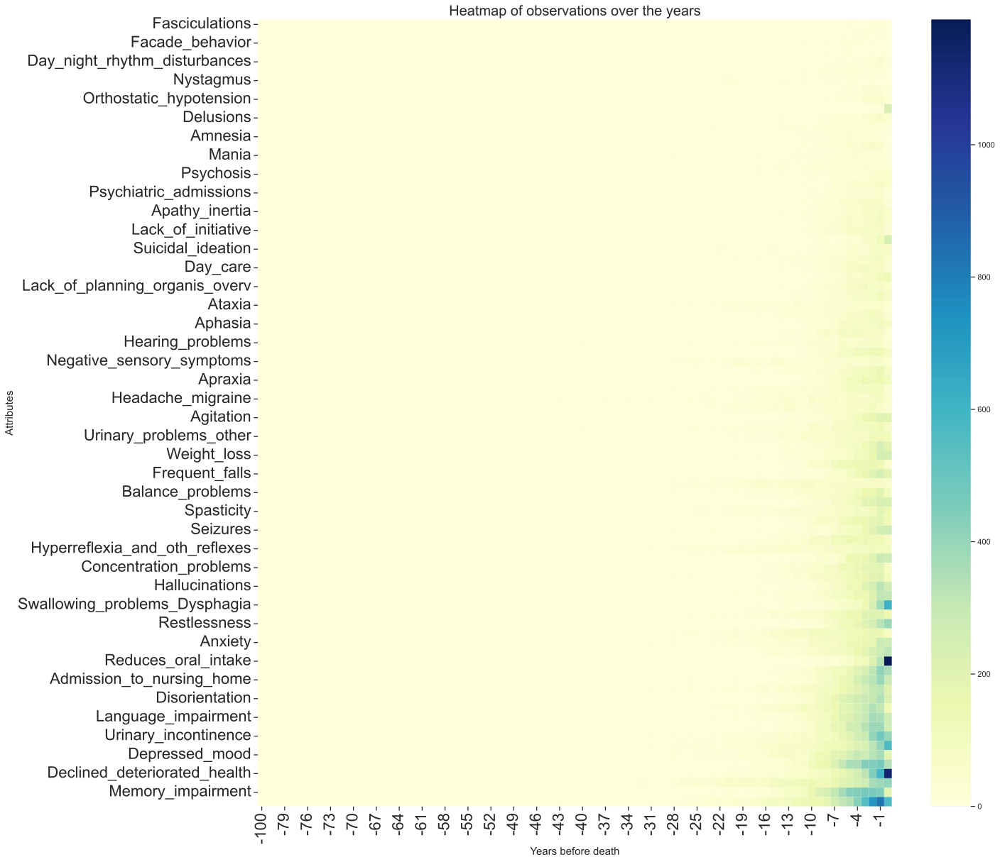

In [67]:

heatmap_df = predictions_df.copy()
heatmap_df.loc[heatmap_df['year_before_death'] == 1]
heatmap_df = heatmap_df[heatmap_df.year_before_death != 9]
heatmap_df = heatmap_df.drop(['DonorID',
                              'neuropathological_diagnosis',
                              'age_at_death',
                              'death_year',
                              'birthyear',
                              'sex',
                              'Age',
                              'Year'], axis=1).groupby('year_before_death').sum()

nice = heatmap_df.T#.iloc[:, ::-1]

nice['total'] = nice.sum(axis=1)
nice = nice.sort_values(by=['total'])
# # display(nice)
nice = nice.drop(['total'],axis=1)
# # # nice = nice.iloc[:,50:]
# nice = nice + 0.001
# nice = np.log2(nice)
nice
# heatmap_df

def sns_heatmap(dataframe, xlabel, ylabel, title):
    '''
    Plot seaborn heatmap
    
        
    Parameters
    ----------
    dataframe : dataframe
        data to use
    xlabel : str
        x label for plot
    ylabel : str
        y label for plot
    title: str
        title for plot
    '''
    fig, ax = plt.subplots(figsize=(20,20))
    sns.set(font_scale=1)
    sns.heatmap(dataframe, cmap="YlGnBu", ax=ax)
#     ax.yaxis.tick_right()
#     plt.yticks(rotation=90)
#     plt.tick_params(axis='y', which='both', labelleft='off', labelright='on',labelrotation=90)

#     set axis
    plt.title(title, fontsize = 20) 
    plt.xlabel(xlabel, fontsize = 15)
    plt.ylabel(ylabel, fontsize = 15)
    
#     show
#     plt.savefig(figure_folder + "/clinical_trajectory_heatmap_log2{}.pdf".format(date.today()),
#             dpi=600, bbox_inches="tight")

    plt.show()
    plt.close()

sns_heatmap(nice, xlabel='Years before death', ylabel='Attributes', title='Heatmap of observations over the years')

In [73]:
non_attribute_columns.append('Age')
print(non_attribute_columns)

data_exploration_df["sum_true"] = data_exploration_df.loc[:,[i for i in list(data_exploration_df.columns) if i not in non_attribute_columns]].sum(axis=1)
data_exploration_df['sentence_length'] = data_exploration_df.Sentence.str.len()
data_exploration_df.head()

['DonorID', 'Year', 'Sentence', 'age_at_death', 'death_year', 'neuropathological_diagnosis', 'birthyear', 'Age', 'year_before_death', 'sex', 'Age', 'Age']


,DonorID,Year,Sentence,Muscular_Weakness,Spasticity,Hyperreflexia_and_oth_reflexes,Fasciculations,Positive_sensory_symptoms,Negative_sensory_symptoms,Parkinsonism,Facial_masking,Tremor,Bradykinesia,Rigidity,Vertigo,Nystagmus,Ataxia,Loss_of_coordination,Balance_problems,Frequent_falls,Decreased_motor_skills,Mobility_problems,Dementia,Cognitive_decline,Bradyphrenia,Lack_of_insight,Facade_behavior,Memory_impairment,Amnesia,Forgetfulness,Imprinting_disturbances,Impaired_recognition,Confabulations,Disorientation,Wandering,Confusion,Aphasia,Word_finding_problems,Language_impairment,Communication_problems,Dysarthria,Apraxia,Executive_function_disorder,Lack_of_planning_organis_overv,Concentration_problems,Disinhibition,Loss_of_decorum,Apathy_inertia,Lack_of_initiative,Compulsive_behavior,Hyperorality,Changed_moods_emotions,Agitation,Aggressive_behavior,Stress,Anxiety,Depressed_mood,Suicidal_ideation,Mania,Psychosis,Psychiatric_admissions,Paranoia_suspiciousness,Hallucinations,Delusions,Delirium,Day_night_rhythm_disturbances,Sleep_disturbances,Restlessness,Vivid_dreaming,Hearing_problems,Visual_problems,Olfactory_gustatory_dysfunction,Urinary_incontinence,Urinary_problems_other,Constipation,Swallowing_problems_Dysphagia,Seizures,Orthostatic_hypotension,Headache_migraine,Fatigue,Declined_deteriorated_health,Cachexia,Weight_loss,Reduces_oral_intake,Help_in_ADL,Day_care,Admission_to_nursing_home,neuropathological_diagnosis,age_at_death,death_year,birthyear,sex,year_before_death,Age,sum_true,sentence_length
1,NBB 1997-127,1996,"Diagnosed with a metastasized adenocarcinoma, ...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,-1,48,0,138
2,NBB 1997-127,1997,Mar: pleural drain due to dyspnea.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49,0,34
3,NBB 1997-127,1997,Mar20th: admitted to hospital for evaluation a...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49,0,93
4,NBB 1997-127,1997,"Her abdomen was very painful, she had lost her...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,CON,49,1997,1948,F,0,49,1,114
5,NBB 1997-127,1997,She underwent chemotherapy with Cisplatinum/Ge...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CON,49,1997,1948,F,0,49,0,56


0      156
1       70
7       70
6       68
2       65
      ... 
235      1
270      1
167      1
355      1
124      1
Name: sum_true, Length: 162, dtype: int64

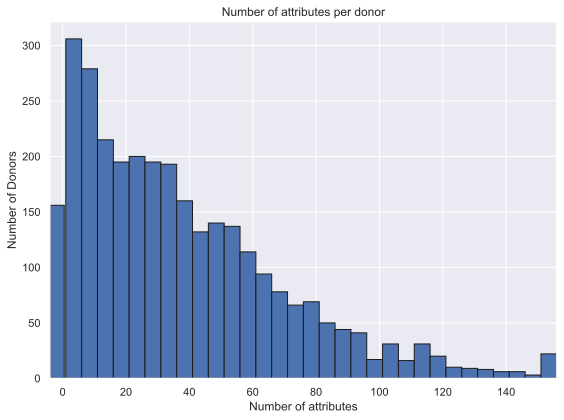

In [102]:

# donor_counts = data_exploration_df.groupby('DonorID').size()
# donor_counts
plt.figure(figsize=(8, 6))
# plt.hist(donor_counts, bins=range(1, donor_counts.max() + 2), edgecolor='black', alpha=0.7)
# plt.xlabel('Number of A per DonorID')
# plt.ylabel('Frequency')
# plt.title('Distribution of Rows per DonorID')
# plt.grid(True)
# plt.show()


# # data_exploration_df['sum_true'].value_counts()
# # data_exploration_df[['DonorID','sum_true']]
grouped_df = data_exploration_df[['DonorID','sum_true']].groupby('DonorID')['sum_true'].sum().reset_index()
display(grouped_df['sum_true'].value_counts())
bins = [-4, 0.5] + list(range(1, 150, 5)) + [151, 800]

# plt.figure(figsize=(10, 6))
plt.hist(grouped_df['sum_true'], bins=bins, edgecolor='k')
plt.xlabel('Number of attributes')
plt.ylabel('Number of Donors')
plt.title('Number of attributes per donor')
plt.xlim(-4, 156)  
plt.tight_layout()
plt.show()

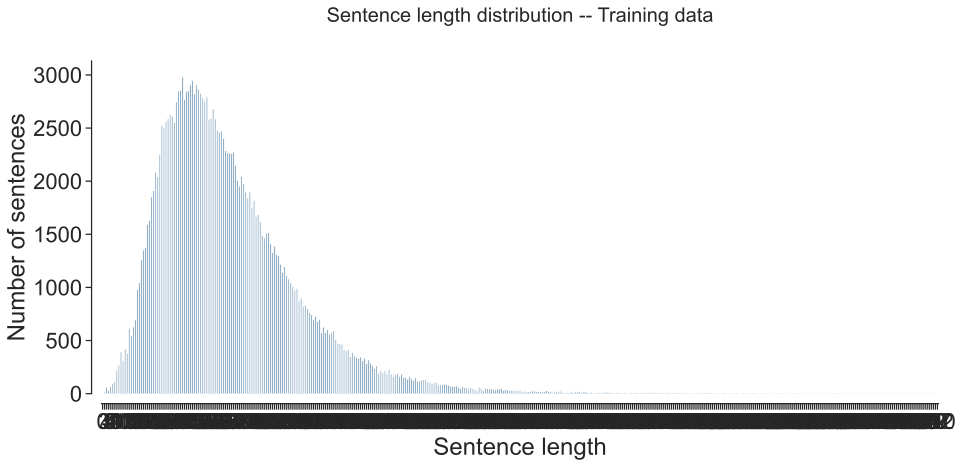

In [49]:
### DATA exploration on sentence data full corpus

data_exploration_df["sum_true"] = data_exploration_df.loc[:,[i for i in list(data_exploration_df.columns) if i not in non_attribute_columns]].sum(axis=1)
data_exploration_df['sentence_length'] = data_exploration_df.Sentence.str.len()

#### How long are our predicted sentences?

%config InlineBackend.figure_format = 'svg'
sns.set(rc={'figure.figsize':(15,6)},font_scale = 2) #
sns.set_palette("pastel")
sns.set_style("ticks")

## get the frequency of the previously created column sentence_length
length_distribution = pd.DataFrame(data_exploration_df['sentence_length'].value_counts())
length_distribution['x'] = length_distribution.index
length_distribution.columns = ['nr_sentences','sentence_length']
zero_row = {'nr_sentences':0, 'sentence_length':0}
# length_distribution = length_distribution.append(zero_row, ignore_index=True)
length_distribution = pd.concat([length_distribution, pd.DataFrame.from_records([zero_row])],
                                ignore_index=True)
length_distribution = length_distribution.sort_values(by=['sentence_length'])

## plot and save
lh = sns.barplot(x="sentence_length", y="nr_sentences", data=length_distribution,color='steelblue')
lh.set(xlabel="Sentence length", ylabel="Number of sentences")
plt.title("Sentence length distribution -- Training data", y=1.1, fontsize = 20)
plt.xticks(rotation=90)
for ind, label in enumerate(lh.get_xticklabels()):
    if ind == 0:
        label.set_visible(True)
    elif ind % 10 == 0: 
        label.set_visible(True)
    else:
        label.set_visible(False)

sns.despine(offset=10, trim=False)
lh.spines["right"].set_color("none")
lh.spines["top"].set_color("none")

plt.savefig(figure_folder + "/full_corpus_sentence_length_distribution_{}.png".format(date.today()),
            dpi=600, bbox_inches="tight")
plt.savefig(figure_folder + "/full_corpus_sentence_length_distribution_{}.pdf".format(date.today()),
            dpi=600, bbox_inches="tight")
plt.show()
plt.close()

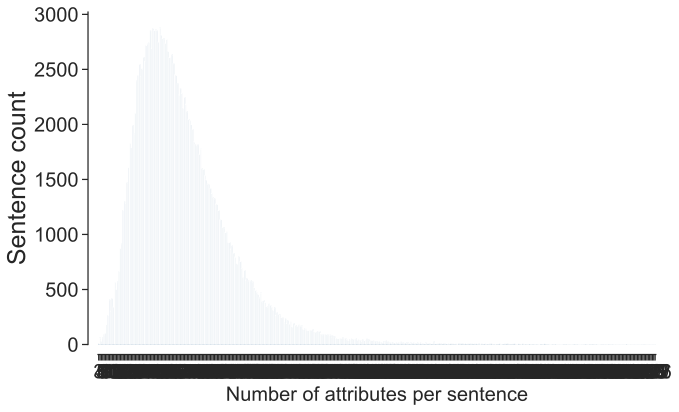

In [50]:
### How many sentences have how many attributes?
#We expect that most sentences have no attribute, many sentences will have a single attribute, and a high amount of attributes for a single sentence is unlikely

## get the frequency of the previously created column counting attributes per sentence
attribute_distribution = pd.DataFrame(data_exploration_df['sum_true'].value_counts())
attribute_distribution['nr_attributes'] = attribute_distribution.index
attribute_distribution.columns = ['nr_sentences','nr_attributes']


fig, ax = plt.subplots(figsize=(10,6))   
ax =  sns.barplot(x="nr_attributes", y="nr_sentences", data=attribute_distribution,color = 'steelblue')
sns.despine(offset=10, trim=False)
ax.spines["right"].set_color("none")
ax.spines["top"].set_color("none")

ax.set_xlabel("Number of attributes per sentence",fontsize=20)
ax.set_ylabel("Sentence count",fontsize=25)
ax.tick_params(labelsize=20)
plt.savefig(figure_folder + "/full_corpus_sentence_att_{}.pdf".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.savefig(figure_folder + "/full_corpus_sentence_att_{}.png".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.show()

In [49]:
attribute_distribution['proportion'] = round(attribute_distribution['nr_sentences']/attribute_distribution['nr_sentences'].sum()*100,2)
palette = sns.color_palette("tab20")[0:9]
attribute_distribution['legend'] = attribute_distribution['nr_attributes'].astype(str) +': ' + attribute_distribution['proportion'].astype(str) + '%'
test = pd.Series(attribute_distribution.nr_sentences.values,index=attribute_distribution.nr_attributes).to_dict()

fig = plt.figure(
    FigureClass=Waffle, 
    rows=110, 
    values=list(attribute_distribution.nr_sentences/13),
    colors = palette,
    figsize=(20, 20),
        legend={'labels':list(attribute_distribution.legend),
            'loc': 'upper right', 'bbox_to_anchor': (1.1, -0.07), 
            'ncol': 5, 
            'framealpha': 0,
            'title':'Attributes per sentence',
            'title_fontsize':8,
            'fontsize': 6
               }    
)
plt.savefig(figure_folder + "/full_corpus_waffle_sentence_att_{}.pdf".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.savefig(figure_folder + "/full_corpus_waffle_sentence_att_{}.png".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.show()

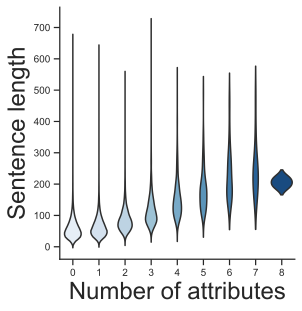

In [39]:



### What is the relationship between sentence length and number of attributes?
#We expect that longer sentences have more attributes

%config InlineBackend.figure_format = 'svg'
sns.set(rc={'figure.figsize':(15,6)},font_scale = 2) #
sns.set_palette("pastel")
sns.set_style("ticks")
g = sns.catplot(x='sum_true', y='sentence_length', data=data_exploration_df,kind="violin",inner=None, palette='Blues')
plt.xlabel("Number of attributes")
plt.ylabel("Sentence length")
plt.tick_params(labelsize=10)
plt.savefig(figure_folder + "/full_corpus_violin_sentence_length_attributes_{}.png".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.savefig(figure_folder + "/full_corpus_violin_sentence_length_attributes_{}.pdf".format(date.today()),
            bbox_inches="tight",dpi=600)
plt.show()

### full corpus: sentence distribution
#We expect to find differences in how many sentences each donor has

# %config InlineBackend.figure_format = 'svg'
# sns.set(rc={'figure.figsize':(30,6)},font_scale = 2) #
# sns.set_palette("pastel")
# sns.set_style("ticks")

# ## NBB nr frequency df
# sentences_per_donor = pd.DataFrame(data_exploration_df['DonorID'].value_counts())
# sentences_per_donor['x'] = sentences_per_donor.index
# sentences_per_donor.columns = ['nr_sentences','DonorID']

# ## plot
# ax = sns.barplot(x="DonorID", y="nr_sentences", data=sentences_per_donor, color='steelblue')
# plt.xlabel("Donor ID")
# plt.ylabel("# of sentences")

# plt.tick_params(labelsize=8)
# ax.spines["right"].set_color("none")
# ax.spines["top"].set_color("none")
# plt.xticks(rotation=90)
# plt.savefig(figure_folder + "/full_corpus_sentences_per_donor_{}.png".format(date.today()),
#             bbox_inches="tight",dpi=600)
# plt.savefig(figure_folder + "/full_corpus_sentences_per_donor_{}.pdf".format(date.today()),
#             bbox_inches="tight",dpi=600)
# plt.show()



